In [ ]:
import glob
from itertools import chain
import os
import random
import zipfile
from tqdm.notebook import tqdm

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from PIL import Image
from sklearn.model_selection import train_test_split
import cv2

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR, CosineAnnealingLR, ReduceLROnPlateau
from torch.utils.data import DataLoader, Dataset
from torchvision import datasets, transforms, models

In [ ]:
#Prueba con triplets y pytorch aplicado a datos con spleet bass y drums cortado a 30s (mil datos aprox)

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
genres_y = [ 'blues', 'bluegrass', 'death-metal','ambient', 'alt-rock', 'afrobeat', 'acoustic', 'club', 'chill', 'deep-house']

In [ ]:
images_full = '/content/drive/Shared drives/SpotifyMemoria/Cover_art_dataset/'

audio_path = '/content/drive/Shared drives/SpotifyMemoria/MM_dataset/train/audio/'

image_path =  '/content/drive/Shared drives/SpotifyMemoria/MM_dataset/train/image/'

spect_path = '/content/drive/Shared drives/SpotifyMemoria/MM_dataset/train/audio_spectrogram/'

In [ ]:
PATH_TRAIN = '/content/drive/Shared drives/SpotifyMemoria/MM_dataset/train/'
PATH_VALID = '/content/drive/Shared drives/SpotifyMemoria/MM_dataset/test/'

In [ ]:
class TripletData(Dataset):
    def __init__(self, path, transforms, split="train"):
        self.path = '/content/drive/Shared drives/SpotifyMemoria/MM_dataset/'
        self.split = split    # train or valid
        self.cats = 10       # number of categories
        self.transforms = transforms
        self.genres_y = [ 'blues', 'bluegrass', 'death-metal','ambient', 'alt-rock', 'afrobeat', 'acoustic', 'club', 'chill', 'deep-house']
        self.spect_path = '/audio_spectrogram/'
        self.image_path = '/image/'
    
    def __getitem__(self, idx):
        
        # our positive class for the triplet
        #idx = str(idx%self.cats + 1)
        idx = self.genres_y[idx%self.cats - 1]

        # choosing our pair of positive images (im1, im2)
        positives = os.listdir(self.path+self.split+self.spect_path+idx)
        #im1, im2 = random.sample(positives, 2)
        im1_id = random.choice(positives)
        im2_id = (im1_id.split('.')[0]) + '.jpg'


        while (not os.path.exists(self.path+self.split+self.image_path+idx+'/'+im2_id)): 
          im1_id = random.choice(positives)
          im2_id = (im1_id.split('.')[0]) + '.jpg'

        # choosing a negative class and negative image (im3)
        #negative_cats = [str(x+1) for x in range(self.cats)]
        #negative_cats.remove(idx)
        negative_cats = [x for x in genres_y if x != idx]
        negative_cat = str(random.choice(negative_cats))

        #negatives = os.listdir(os.path.join(self.path, negative_cat))
        negatives = os.listdir(self.path+self.split+self.image_path+negative_cat)
        im3_id = random.choice(negatives)
        
        im1 = Image.open(self.path+self.split+self.spect_path+idx+'/'+im1_id)
        im2 = Image.open(self.path+self.split+self.image_path+idx+'/'+im2_id)
        im3 = Image.open(self.path+self.split+self.image_path+negative_cat+'/'+im3_id)

        if(im1.mode == 'L'):
          im1 = im1.convert('RGB')

        elif(im2.mode == 'L'):
          im2 = im2.convert('RGB')
        
        elif(im3.mode == 'L'):
          im3 = im3.convert('RGB')


        im1 = self.transforms(im1)
        im2 = self.transforms(im2)
        im3 = self.transforms(im3)
        
        #print('perrito')

        return [im1, im2, im3]
        
    # we'll put some value that we want since there can be far too many triplets possible
    # multiples of the number of images/ number of categories is a good choice
    def __len__(self):
        return self.cats*8
    

# Transforms
train_transforms = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

val_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])


# Datasets and Dataloaders
train_data = TripletData(PATH_TRAIN, train_transforms)
val_data = TripletData(PATH_VALID, val_transforms)

train_loader = torch.utils.data.DataLoader(dataset = train_data, batch_size=32, shuffle=True, num_workers=2)
val_loader = torch.utils.data.DataLoader(dataset = val_data, batch_size=32, shuffle=False, num_workers=2)

In [ ]:
class TripletLoss(nn.Module):
    def __init__(self, margin=1.0):
        super(TripletLoss, self).__init__()
        self.margin = margin
        
    def calc_euclidean(self, x1, x2):
        return (x1 - x2).pow(2).sum(1)
    
    # Distances in embedding space is calculated in euclidean
    def forward(self, anchor, positive, negative):
        distance_positive = self.calc_euclidean(anchor, positive)
        distance_negative = self.calc_euclidean(anchor, negative)
        losses = torch.relu(distance_positive - distance_negative + self.margin)
        return losses.mean()

In [ ]:
#https://towardsdatascience.com/a-hands-on-introduction-to-image-retrieval-in-deep-learning-with-pytorch-651cd6dba61e
epochs = 2
device = 'cuda'

# Our base model
model = models.resnet18().cuda()
optimizer = optim.Adam(model.parameters(), lr=0.001)
triplet_loss = TripletLoss()

# Training
for epoch in range(epochs):
    
    model.train()
    epoch_loss = 0.0
    for data in tqdm(train_loader):
        optimizer.zero_grad()
        x1,x2,x3 = data
        e1 = model(x1.to(device))
        e2 = model(x2.to(device))
        e3 = model(x3.to(device)) 
        
        loss = triplet_loss(e1,e2,e3)
        epoch_loss += loss
        loss.backward()
        optimizer.step()
    print("Train Loss: {}".format(epoch_loss.item()))

  0%|          | 0/3 [00:00<?, ?it/s]

Train Loss: 53.33409881591797


  0%|          | 0/3 [00:00<?, ?it/s]

Train Loss: 70.12804412841797


In [ ]:
!pip install faiss-gpu

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 85.5 MB 122 kB/s 


In [ ]:
#!pip install faiss-gpu
import faiss                            
faiss_index = faiss.IndexFlatL2(1000)   # build the index

im_indices = []
with torch.no_grad():
    for genre in genres_y: 
        path_curr = PATH_TRAIN+ 'audio_spectrogram/' + genre
        search_path = os.listdir(path_curr)
    #for f in glob.glob(os.path.join(PATH_TRAIN, '*/*')):
        for f in search_path:
          im = Image.open(path_curr+'/'+f)
          if(im.mode == 'RGBA'):
            print(path_curr+'/'+f)
          im = im.resize((224,224))
          im = torch.tensor([val_transforms(im).numpy()]).cuda()
      
          preds = model(im)
          preds = np.array([preds[0].cpu().numpy()])
          faiss_index.add(preds) #add the representation to index
          im_indices.append(f)   #store the image name to find it later on

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at  ../torch/csrc/utils/tensor_new.cpp:201.)
  app.launch_new_instance()


In [ ]:
PATH_TEST = '/content/drive/Shared drives/SpotifyMemoria/MM_dataset/test/'

In [ ]:
from sys import path
with torch.no_grad():
    for genre in genres_y: 
        path_curr = PATH_TEST+ 'audio_spectrogram/' + genre
        search_path = os.listdir(path_curr)
    #for f in glob.glob(os.path.join(PATH_TRAIN, '*/*')):
        for f in search_path:
          im = Image.open(os.path.join(path_curr,f))
          im = im.resize((224,224))
          im = torch.tensor([val_transforms(im).numpy()]).cuda()
      
          test_embed = model(im).cpu().numpy()
          _, I = faiss_index.search(test_embed, 5)
          print("Retrieved Image: {}".format(im_indices[I[0][0]]))

Retrieved Image: 3iGz75NJkqHubYUMRELLyP.jpg
Retrieved Image: 7uqohNjCnZ8sZd5S2vh5vx.jpg
Retrieved Image: 53gaMfQW5gdchpeDNAHMsU.jpg
Retrieved Image: 7uFF1xvJOLUP8q3dbQS6i6.jpg
Retrieved Image: 0YbnlpKz1ZiF3PSaAWyFJT.jpg
Retrieved Image: 0HOrDVS349XFcpCYsO2hAP.jpg
Retrieved Image: 2m8muGVeaAmpKv9oGlKKC6.jpg
Retrieved Image: 7qIw4D1PcDHigDohKkLB0W.jpg
Retrieved Image: 21YxK0klhpfLW8budkJaMF.jpg
Retrieved Image: 2PIlBukQ6limukVR8Ubb5o.jpg
Retrieved Image: 7L2arBxHMxVXbWQzaHKgnY.jpg
Retrieved Image: 0wvIGFIgbyz4JNwQhZgTv2.jpg
Retrieved Image: 6TTudSWfeluwJ0KTPaRd5g.jpg
Retrieved Image: 1IiH5OGVjBAMjskNdXJDwS.jpg
Retrieved Image: 5p7kurFWJoHUi0SGhBX97f.jpg
Retrieved Image: 3iGz75NJkqHubYUMRELLyP.jpg
Retrieved Image: 73kaKlRGTP4tsN47JPxL2P.jpg
Retrieved Image: 0Pha29SAHnAg4JMKVzGsWi.jpg
Retrieved Image: 4TwVtW8hS5LyLoDtJGpUOg.jpg
Retrieved Image: 0Pha29SAHnAg4JMKVzGsWi.jpg
Retrieved Image: 5Yq6o938MU67LT4XeqjiTT.jpg
Retrieved Image: 3pJfnBjO3kjudEchcPEDxS.jpg
Retrieved Image: 35WLsndw0QDVBHU

## Prueba de retrieval

In [ ]:
#Pista musical
import IPython.display as ipd
ipd.Audio(audio_path+'death-metal/0cEai6VAETowu2cm83Gt8l.wav')
#playsound(audio_path+'death-metal/0cEai6VAETowu2cm83Gt8l.wav')

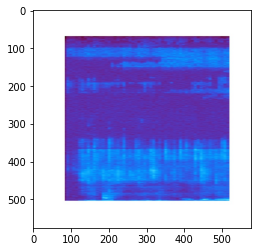

In [ ]:
#Espectrograma
import numpy as np
import cv2
import matplotlib.pyplot as plt
%matplotlib inline 

img = cv2.imread(spect_path+'death-metal/0cEai6VAETowu2cm83Gt8l.jpg',1) # reads image 'opencv-logo.png' as grayscale
plt.imshow(img)

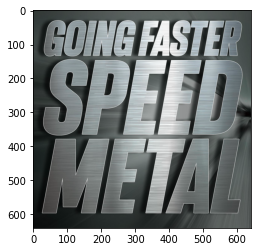

In [ ]:
#Imagen cover art
img = cv2.imread(image_path+'death-metal/0cEai6VAETowu2cm83Gt8l.jpg',1) # reads image 'opencv-logo.png' as grayscale
plt.imshow(img)

In [ ]:
#Top 100 k nearest neighbour
def get_kNN(path_image):
  with torch.no_grad():
    im = Image.open(path_image)
    im = im.resize((224,224))
    im = torch.tensor([val_transforms(im).numpy()]).cuda()

    test_embed = model(im).cpu().numpy()
    _, I = faiss_index.search(test_embed, 100) #Tensor de la imagen y la cantidad de kNN
    print("Retrieved Image: {}".format(im_indices[I[0][0]]))
    return I  #Contiene los indices de los 10 vecinos más cercanos

In [ ]:
kNN = get_kNN(spect_path+'death-metal/0cEai6VAETowu2cm83Gt8l.jpg')

Retrieved Image: 0cEai6VAETowu2cm83Gt8l.jpg


In [ ]:
print(im_indices[kNN[0][9]])

6SoPEJOMeQmkgEEc8V70QT.jpg


In [ ]:
def search_path(file, path):

  files = glob.glob(path + "/**/"+file, recursive = True)

  print(files)
  return files[0]

In [ ]:
def show_knn(knn, path):
  knn_list = []
  files_list = []
  for i in range(100):
    image = im_indices[knn[0][i-1]]

    files = search_path(image, path)
    files_list.append(files)
    knn_list.append(image)
  return knn_list, files_list


In [ ]:
knn_list, files_list = show_knn(kNN, image_path)

['/content/drive/Shared drives/SpotifyMemoria/MM_dataset/train/image/alt-rock/6p6Xq0t9XGkVg04cXWdx8v.jpg']
['/content/drive/Shared drives/SpotifyMemoria/MM_dataset/train/image/death-metal/0cEai6VAETowu2cm83Gt8l.jpg']
['/content/drive/Shared drives/SpotifyMemoria/MM_dataset/train/image/afrobeat/0sDc20D04QVMR1V3uF3RnQ.jpg']
['/content/drive/Shared drives/SpotifyMemoria/MM_dataset/train/image/chill/1HNVhMuR5929BFbxx8XSjX.jpg']
['/content/drive/Shared drives/SpotifyMemoria/MM_dataset/train/image/alt-rock/1VIxH717Wpme59Yja4PhcI.jpg']
['/content/drive/Shared drives/SpotifyMemoria/MM_dataset/train/image/chill/1STcbHSVDutpKAuHWozPbN.jpg']
['/content/drive/Shared drives/SpotifyMemoria/MM_dataset/train/image/afrobeat/5pdmnXCXV0nqxAXQqSQmKQ.jpg']
['/content/drive/Shared drives/SpotifyMemoria/MM_dataset/train/image/death-metal/1098u0kZGMbAlggh8sjKTW.jpg']
['/content/drive/Shared drives/SpotifyMemoria/MM_dataset/train/image/afrobeat/2p361jV44d4AtfNevM8GAy.jpg']
['/content/drive/Shared drives/Spotif

In [ ]:
files_list

['/content/drive/Shared drives/SpotifyMemoria/MM_dataset/train/image/alt-rock/6p6Xq0t9XGkVg04cXWdx8v.jpg',
 '/content/drive/Shared drives/SpotifyMemoria/MM_dataset/train/image/death-metal/0cEai6VAETowu2cm83Gt8l.jpg',
 '/content/drive/Shared drives/SpotifyMemoria/MM_dataset/train/image/afrobeat/0sDc20D04QVMR1V3uF3RnQ.jpg',
 '/content/drive/Shared drives/SpotifyMemoria/MM_dataset/train/image/chill/1HNVhMuR5929BFbxx8XSjX.jpg',
 '/content/drive/Shared drives/SpotifyMemoria/MM_dataset/train/image/alt-rock/1VIxH717Wpme59Yja4PhcI.jpg',
 '/content/drive/Shared drives/SpotifyMemoria/MM_dataset/train/image/chill/1STcbHSVDutpKAuHWozPbN.jpg',
 '/content/drive/Shared drives/SpotifyMemoria/MM_dataset/train/image/afrobeat/5pdmnXCXV0nqxAXQqSQmKQ.jpg',
 '/content/drive/Shared drives/SpotifyMemoria/MM_dataset/train/image/death-metal/1098u0kZGMbAlggh8sjKTW.jpg',
 '/content/drive/Shared drives/SpotifyMemoria/MM_dataset/train/image/afrobeat/2p361jV44d4AtfNevM8GAy.jpg',
 '/content/drive/Shared drives/Spotif

In [ ]:

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

def plot_knn(files_list):
  images = []
  for img_path in files_list:
      images.append(mpimg.imread(img_path))

  plt.figure(figsize=(40,40))
  f, axarr = plt.subplots(2,5)

  axarr[0,0].imshow(images[0])
  axarr[0,1].imshow(images[1])
  axarr[0,2].imshow(images[2])
  axarr[0,3].imshow(images[3])
  axarr[0,4].imshow(images[4])
  axarr[1,0].imshow(images[5])
  axarr[1,1].imshow(images[6])
  axarr[1,2].imshow(images[7])
  axarr[1,3].imshow(images[8])
  axarr[1,4].imshow(images[9])

<Figure size 2880x2880 with 0 Axes>

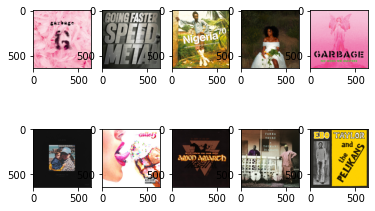

In [ ]:
plot_knn(files_list)

In [ ]:
#Train GAN to generate images from the k nearest neighbours

import tensorflow as tf
from tensorflow.keras.layers import (Dense, 
                                     BatchNormalization, 
                                     LeakyReLU, 
                                     Reshape, 
                                     Conv2DTranspose,
                                     Conv2D,
                                     Dropout,
                                     Flatten)
import matplotlib.pyplot as plt

In [ ]:
# load image and convert to and from NumPy array
from PIL import Image
from numpy import asarray
from skimage import transform, data, io
import cv2
# load the image
def img_to_array(path):

  img = cv2.imread(path, 1) #change 1 to 0 for gray images

  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img = cv2.resize(img, (256,256))
  # convert image to numpy array
  #image = image.convert('RGB')
  data = asarray(img)
  #data = tf.convert_to_tensor(data)
  # summarize shape
  return data

In [ ]:
#Load data version 100 images
train_images = np.zeros((100, 256,256,3))
for index, file in enumerate(files_list):
  image = img_to_array(file)
  train_images[index] = image

BUFFER_SIZE = 100
BATCH_SIZE = 10

# Batch and shuffle the data
train_dataset = tf.data.Dataset.from_tensor_slices(train_images).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

In [ ]:
'''
# underscore to omit the label arrays
(train_images, train_labels), (_, _) = tf.keras.datasets.mnist.load_data() 


train_images = train_images.reshape(train_images.shape[0], 28, 28, 1).astype('float32')
train_images = (train_images - 127.5) / 127.5 # Normalize the images to [-1, 1]

BUFFER_SIZE = 60000
BATCH_SIZE = 256

# Batch and shuffle the data
train_dataset = tf.data.Dataset.from_tensor_slices(train_images).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
'''

11501568/11490434 [==============================] - 0s 0us/step


In [ ]:
len(train_labels)

NameError: ignored

In [ ]:
#Discriminador
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(Dense(7*7*256, use_bias=False, input_shape=(100,)))
    model.add(BatchNormalization())
    model.add(LeakyReLU())

    model.add(Reshape((7, 7, 256)))
    assert model.output_shape == (None, 7, 7, 256) # Note: None is the batch size

    model.add(Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    assert model.output_shape == (None, 7, 7, 128)
    model.add(BatchNormalization())
    model.add(LeakyReLU())

    model.add(Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 14, 14, 64)
    model.add(BatchNormalization())
    model.add(LeakyReLU())

    model.add(Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    assert model.output_shape == (None, 28, 28, 1)

    return model

In [ ]:
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(Dense(64*64*256, use_bias=False, input_shape=(100,)))
    model.add(BatchNormalization())
    model.add(LeakyReLU())

    model.add(Reshape((64, 64, 256)))
    print(model.output_shape)
    assert model.output_shape == (None, 64, 64, 256) # Note: None is the batch size

    model.add(Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    assert model.output_shape == (None, 64, 64, 128)
    model.add(BatchNormalization())
    model.add(LeakyReLU())

    model.add(Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 128, 128, 64)
    model.add(BatchNormalization())
    model.add(LeakyReLU())

    model.add(Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    assert model.output_shape == (None, 256, 256, 3)

    return model

In [ ]:
generator = make_generator_model()


(None, 64, 64, 256)


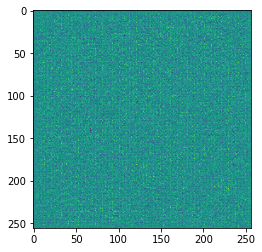

In [ ]:
#Generar random noise
# Create a random noise and generate a sample

#imarray = numpy.random.rand(100,100,3) * 255
#im = Image.fromarray(imarray.astype('uint8')).convert('RGBA')
noise = tf.random.normal([BATCH_SIZE, 100])
plt.imshow(noise)
generated_image = generator(noise, training=False)
# Visualize the generated sample
plt.imshow(generated_image[0, :, :, 0])

In [ ]:
#Se crea el Discriminador 
def make_discriminator_model():
    model = tf.keras.Sequential()
    
    model.add(Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[256, 256, 3]))
    model.add(LeakyReLU())
    model.add(Dropout(0.3))

    model.add(Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(LeakyReLU())
    model.add(Dropout(0.3))

    model.add(Flatten())
    model.add(Dense(1))

    return model

In [ ]:
discriminator = make_discriminator_model()

In [ ]:
decision = discriminator(generated_image)
print (decision)

tf.Tensor(
[[ 9.5704687e-04]
 [ 3.9974914e-04]
 [ 5.4986752e-04]
 [ 4.8661925e-05]
 [-3.6384605e-04]
 [ 5.0579278e-05]
 [ 4.6748020e-05]
 [ 5.9257535e-04]
 [ 6.0884668e-05]
 [-7.9338482e-05]], shape=(10, 1), dtype=float32)


In [ ]:
# This method returns a helper function to compute cross entropy loss
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

In [ ]:
import os

checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

### Las GANs requieren training loops customizados

In [ ]:
EPOCHS = 200
# We will reuse this seed overtime (so it's easier)
# to visualize progress in the animated GIF)
num_examples_to_generate = 16
noise_dim = 100
seed = tf.random.normal([num_examples_to_generate, noise_dim])

In [ ]:

# tf.function annotation causes the function 
# to be "compiled" as part of the training
@tf.function
def train_step(images):
  
    # 1 - Create a random noise to feed it into the model
    # for the image generation
    noise = tf.random.normal([BATCH_SIZE, noise_dim])
    
    # 2 - Generate images and calculate loss values
    # GradientTape method records operations for automatic differentiation.
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      generated_images = generator(noise, training=True)

      real_output = discriminator(images, training=True)
      fake_output = discriminator(generated_images, training=True)

      gen_loss = generator_loss(fake_output)
      disc_loss = discriminator_loss(real_output, fake_output)

    # 3 - Calculate gradients using loss values and model variables
    # "gradient" method computes the gradient using 
    # operations recorded in context of this tape (gen_tape and disc_tape).
    
    # It accepts a target (e.g., gen_loss) variable and 
    # a source variable (e.g.,generator.trainable_variables)
    # target --> a list or nested structure of Tensors or Variables to be differentiated.
    # source --> a list or nested structure of Tensors or Variables.
    # target will be differentiated against elements in sources.

    # "gradient" method returns a list or nested structure of Tensors  
    # (or IndexedSlices, or None), one for each element in sources. 
    # Returned structure is the same as the structure of sources.
    gradients_of_generator = gen_tape.gradient(gen_loss, 
                                               generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, 
                                                discriminator.trainable_variables)
    
    # 4 - Process  Gradients and Run the Optimizer
    # "apply_gradients" method processes aggregated gradients. 
    # ex: optimizer.apply_gradients(zip(grads, vars))
    """
    Example use of apply_gradients:
    grads = tape.gradient(loss, vars)
    grads = tf.distribute.get_replica_context().all_reduce('sum', grads)
    # Processing aggregated gradients.
    optimizer.apply_gradients(zip(grads, vars), experimental_aggregate_gradients=False)
    """
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

In [ ]:
def generate_and_save_images(model, epoch, test_input):
  # Notice `training` is set to False.
  # This is so all layers run in inference mode (batchnorm).
  # 1 - Generate images
  predictions = model(test_input, training=False)
  # 2 - Plot the generated images
  fig = plt.figure(figsize=(4,4))
  for i in range(predictions.shape[0]):
      plt.subplot(4, 4, i+1)
      plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5)
      plt.axis('off')
  # 3 - Save the generated images
  plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
  plt.show()

In [ ]:
import time
from IPython import display # A command shell for interactive computing in Python.

def train(dataset, epochs):
  # A. For each epoch, do the following:
  for epoch in range(epochs):
    start = time.time()
    # 1 - For each batch of the epoch, 
    for image_batch in dataset:
      # 1.a - run the custom "train_step" function
      # we just declared above
      train_step(image_batch)

    # 2 - Produce images for the GIF as we go
    display.clear_output(wait=True)
    generate_and_save_images(generator,
                             epoch + 1,
                             seed)

    # 3 - Save the model every 5 epochs as 
    # a checkpoint, which we will use later
    if (epoch + 1) % 5 == 0:
      checkpoint.save(file_prefix = checkpoint_prefix)

    # 4 - Print out the completed epoch no. and the time spent
    print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))

  # B. Generate a final image after the training is completed
  display.clear_output(wait=True)
  generate_and_save_images(generator,
                           epochs,
                           seed)

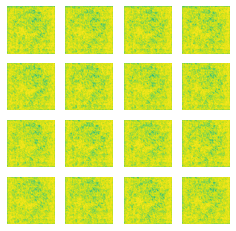

In [ ]:
train(train_dataset, EPOCHS)

In [ ]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

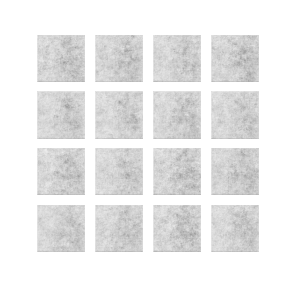

In [ ]:
# PIL is a library which may open different image file formats
import PIL 
# Display a single image using the epoch number
def display_image(epoch_no):
  return PIL.Image.open('image_at_epoch_{:04d}.png'.format(epoch_no))
display_image(EPOCHS)

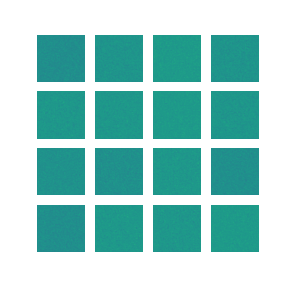

In [ ]:
import glob # The glob module is used for Unix style pathname pattern expansion.
import imageio # The library that provides an easy interface to read and write a wide range of image data

anim_file = 'dcgan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  # image = imageio.imread(filename)
  # writer.append_data(image)
  
display.Image(open('dcgan.gif','rb').read())